This notebook was adapted from David Shean's tutorial on pulling SNOTEL data (located here: )

In [1]:
"""
    IMPORT LIBRARIES
"""
import netCDF4 as nc
import pyproj
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import geopandas as gpd
import pandas as pd
import ulmo
from shapely.geometry import Point
import contextily as ctx
import os
from datetime import datetime

In [2]:
"""
    IMPORT FUNCTIONS
"""
from snotel.snotel import getStation_output as get_data

In [3]:
"""
    IMPORT SNOWMODEL DOMAIN
"""
nx = 14969
ny = 8781
# topo_vege #
file = 'topo_vege.gdat'
file_path = '/glade/scratch/rossamower/snow/snowmodel/washington/ids/topo_vege/NoAm_30m/'
# lat / lon #
lon_file = 'grid_lon.gdat'
lat_file = 'grid_lat.gdat'
lat_long_fpath = '/glade/scratch/rossamower/snow/snowmodel/washington/ids/extra_met/'
lat_long_fpath = '/glade/scratch/rossamower/snow/snowmodel/washington/ids/extra_met/'

In [4]:
'''
    BUILD ARRAYS AND OUTPUT
'''
## build topo and vege ##
array = np.fromfile(file_path + file, dtype = np.float32)
array_3D = array.reshape(2,ny,nx)
topo_2D = array_3D[0,:,:]
vege_2D = array_3D[1,:,:]
#topo_1D = topo_2D.reshape(ny*nx)

## build lat and lon ##
array_lat_1D = np.fromfile(lat_long_fpath + lat_file, dtype = np.float32)
array_lon_1D = np.fromfile(lat_long_fpath + lon_file, dtype = np.float32)
lat_2D = array_lat_1D.reshape(ny,nx)
lon_2D = array_lon_1D.reshape(ny,nx)

In [5]:
"""
    CREATE NETCDF FILE
"""

## elevation xarray ##
ds_hgt = xr.Dataset(
        data_vars = dict(
            dataset = (["south_north","east_west"],topo_2D),),
        coords={"XLAT": (("south_north","east_west"),lat_2D),
                "XLONG": (("south_north","east_west"),lon_2D)})
ds_hgt = ds_hgt.rename({'dataset' : 'HGT'})



## save netcdf file ##
# ds_hgt.to_netcdf(file_path + 'west_topo.nc')

## veg xarray ##
ds_veg = xr.Dataset(
        data_vars = dict(
            dataset = (["south_north","east_west"],vege_2D),),
        coords={"XLAT": (("south_north","east_west"),lat_2D),
                "XLONG": (("south_north","east_west"),lon_2D)})
ds_veg = ds_veg.rename({'dataset' : 'VEG'})

In [6]:
"""
    IMPORT SHAPEFILE
"""
shp_fpath = '/glade/u/home/rossamower/work/github_postproc/Presentation/figures/snowmodel/shapefile/'
shp_file = 'cb_2018_us_state_20m.shp'
## load state boundaries ##
state_boundary = gpd.read_file(shp_fpath + shp_file)
country_boundary = gpd.read_file(shp_fpath + shp_file)
state_boundary = state_boundary.to_crs(epsg=4326)
country_boundary = country_boundary.to_crs(epsg=4326)
print(state_boundary.crs)
wa_boundary_gpd = country_boundary[country_boundary['STUSPS'] == 'WA']
wa_boundary_gpd

epsg:4326


,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
6,53,01779804,0400000US53,53,WA,Washington,00,172112588220,12559278850,"MULTIPOLYGON (((-123.23715 48.68347, -123.0704..."


In [7]:
"""
    LOAD SNOTEL LOCATIONS
"""
## CUASI API ##
# http://his.cuahsi.org/wofws.html
wsdlurl = 'https://hydroportal.cuahsi.org/Snotel/cuahsi_1_1.asmx?WSDL'

# identify SNOTEL site locations
sites = ulmo.cuahsi.wof.get_sites(wsdlurl)

# convert to pandas dataframe from dictionary and drop na values
sites_df = pd.DataFrame.from_dict(sites, orient='index').dropna()
sites_df

# clean up dataframe and prepare point geometry objects, need x and y locs
# do this by creating a new column (geometry) and pulling lat and long info and use Point package to pull info from dict
sites_df['geometry']=[Point(float(loc['longitude']),float(loc['latitude'])) for loc in sites_df['location']]
sites_df = pd.concat([sites_df, sites_df["location"].apply(pd.Series)], axis=1)
sites_df = sites_df.drop(columns='location')
sites_df = sites_df.astype({'elevation_m':float,'latitude':float,'longitude':float})

# gathers all snotel sites #
sites_gdf_all = gpd.GeoDataFrame(sites_df, crs='EPSG:4326')

# wa snotel sites #
sites_gme_wa = sites_gdf_all[sites_gdf_all.index.str.contains('WA')]

# eastern wa snotel sites
xmin, xmax, ymin, ymax = [-122.5, -117, 47, 49]
sites_gdf_ewa = sites_gme_wa.cx[xmin:xmax, ymin:ymax]
sites_gdf_ewa;


In [8]:
ds_hgt

<xarray.Dataset>
Dimensions:  (south_north: 8781, east_west: 14969)
Coordinates:
    XLAT     (south_north, east_west) float32 46.7 46.7 46.7 ... 49.09 49.09
    XLONG    (south_north, east_west) float32 -123.0 -123.0 ... -116.7 -116.7
Dimensions without coordinates: south_north, east_west
Data variables:
    HGT      (south_north, east_west) float32 69.27 69.13 ... 1.309e+03

/glade/scratch/rossamower/ipykernel_167917/3197452562.py:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(ds_hgt.XLONG,ds_hgt.XLAT,ds_hgt.HGT,vmin = ds_hgt.HGT.min(),vmax = ds_hgt.HGT.max())


<AxesSubplot:>

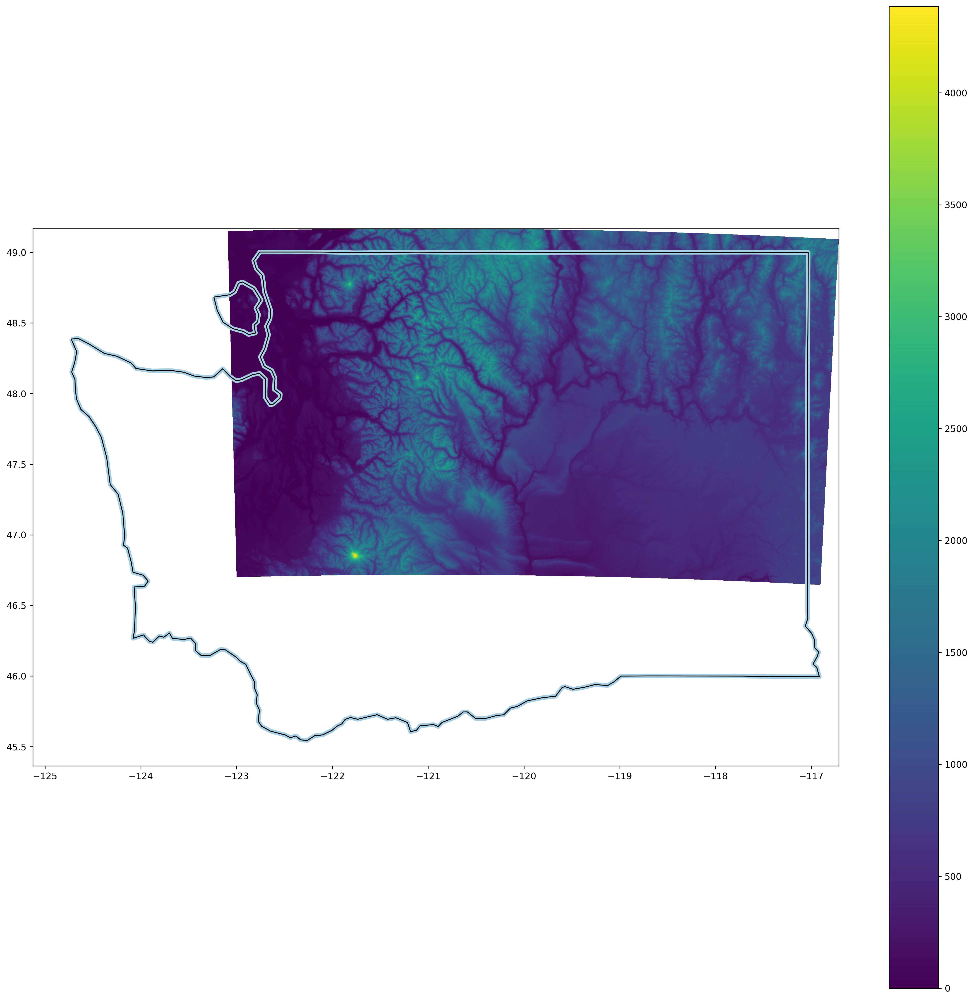

In [9]:
"""
    PLOT ELEVATION
"""
fig,ax = plt.subplots(figsize = (20,20),dpi = 300)
plt.pcolormesh(ds_hgt.XLONG,ds_hgt.XLAT,ds_hgt.HGT,vmin = ds_hgt.HGT.min(),vmax = ds_hgt.HGT.max())
plt.colorbar()
wa_boundary_gpd.plot(ax = ax,facecolor = 'none', edgecolor = '#a6cee3',linewidth = 5)
wa_boundary_gpd.plot(ax = ax,facecolor = 'none', edgecolor = 'k')
# sites_gdf_ewa.plot(ax=ax,color = 'red')

/glade/scratch/rossamower/ipykernel_167917/3954533937.py:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(ds_veg.XLONG,ds_veg.XLAT,ds_veg.VEG)


<AxesSubplot:>

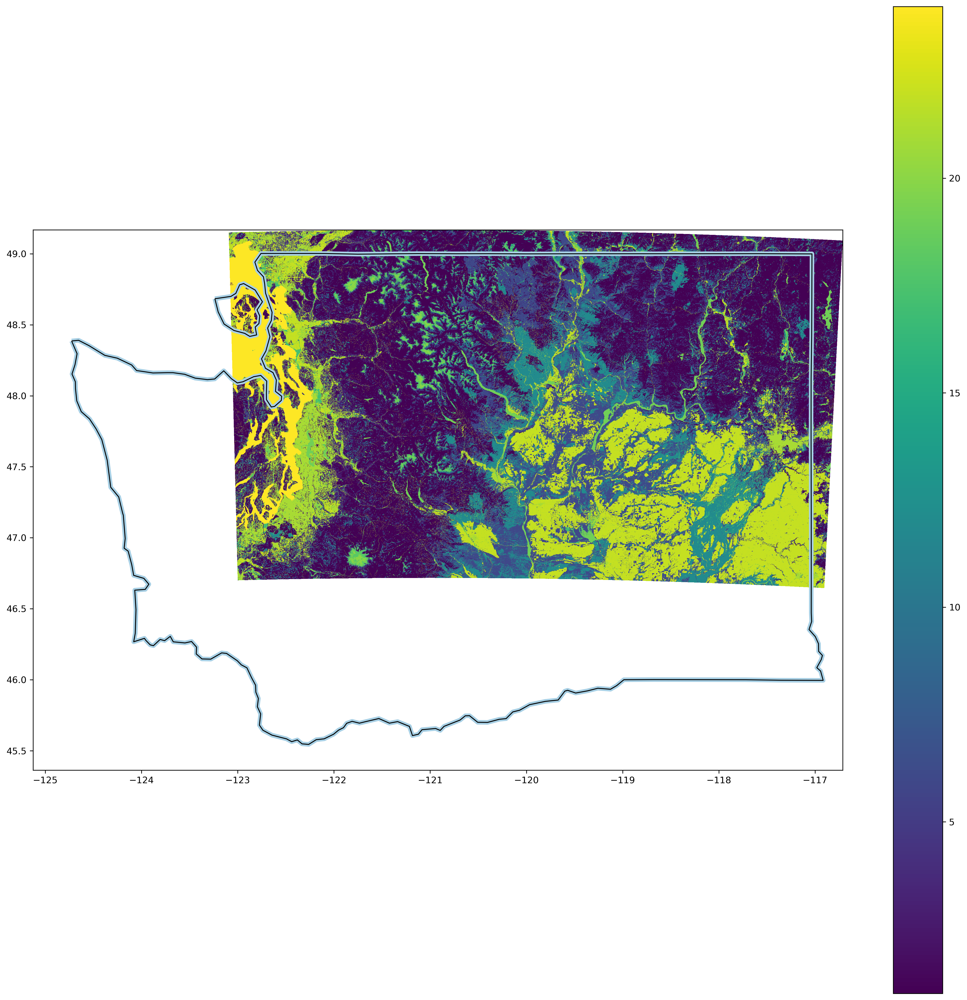

In [10]:
"""
    PLOT VEGETATION
"""
fig,ax = plt.subplots(figsize = (20,20),dpi = 300)
plt.pcolormesh(ds_veg.XLONG,ds_veg.XLAT,ds_veg.VEG)
plt.colorbar()
wa_boundary_gpd.plot(ax = ax,facecolor = 'none', edgecolor = '#a6cee3',linewidth = 5)
wa_boundary_gpd.plot(ax = ax,facecolor = 'none', edgecolor = 'k')

/glade/scratch/rossamower/ipykernel_167917/3845967282.py:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(ds_hgt.XLONG,ds_hgt.XLAT,ds_hgt.HGT,vmin = ds_hgt.HGT.min(),vmax = ds_hgt.HGT.max())


<AxesSubplot:>

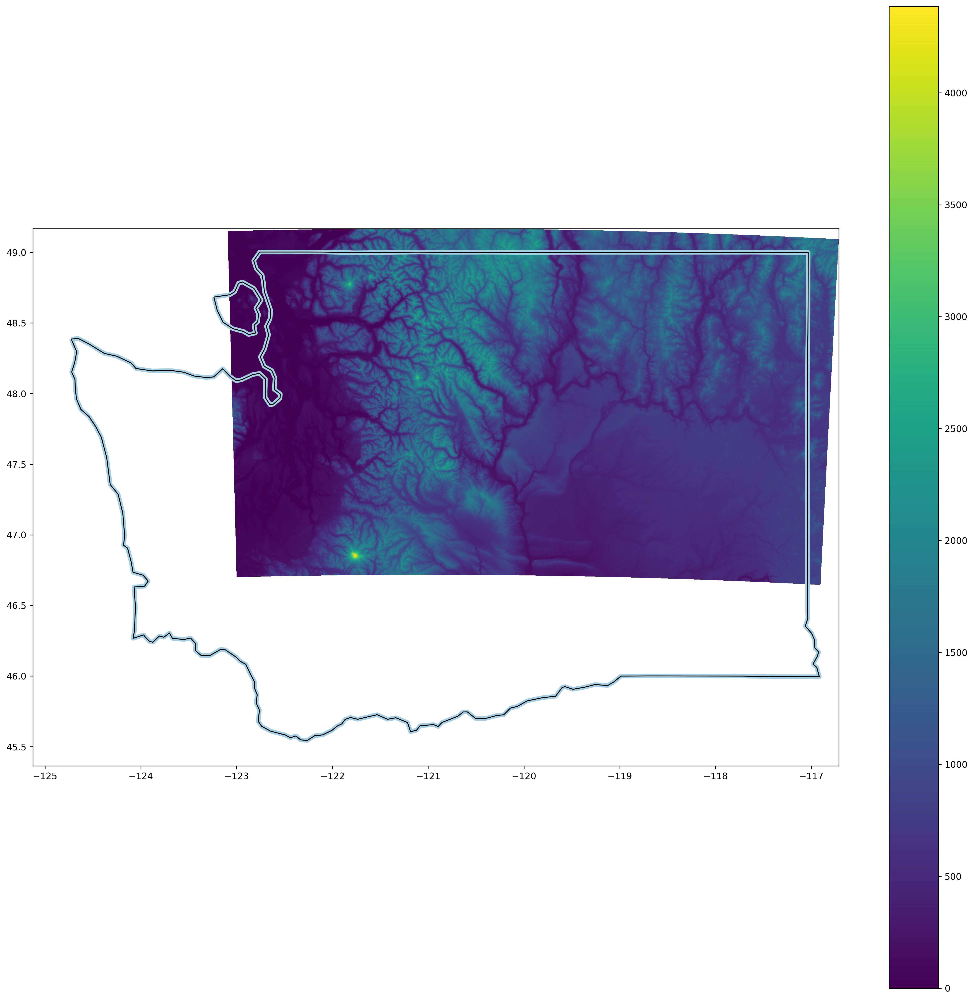

In [11]:
"""
    PLOT SNOTEL
"""
fig,ax = plt.subplots(figsize = (20,20),dpi = 300)
plt.pcolormesh(ds_hgt.XLONG,ds_hgt.XLAT,ds_hgt.HGT,vmin = ds_hgt.HGT.min(),vmax = ds_hgt.HGT.max())
plt.colorbar()
wa_boundary_gpd.plot(ax = ax,facecolor = 'none', edgecolor = '#a6cee3',linewidth = 5)
wa_boundary_gpd.plot(ax = ax,facecolor = 'none', edgecolor = 'k')
# sites_gdf_ewa.plot(ax=ax,color = 'red')

In [12]:
"""
    PULL SNOTEL DATA
        loop through sites and call CUAHSI API
"""
# start, end = '2018-10-01', '2019-09-30'
start, end = '2020-10-01', '2021-09-30'
outpath = '/glade/scratch/rossamower/snow/snowmodel/washington/conus_404/python/snotel/data/WY2021/'
missing_data = []
for i in sites_gdf_ewa.index:
    print(i)
    snotel_code = i
    site_name = sites_gdf_ewa.at[i, 'name']
    lat = sites_gdf_ewa.at[i, 'latitude']
    lon = sites_gdf_ewa.at[i, 'longitude']
    
    
    missing = get_data(outpath, site_name, snotel_code, start, end,lat,lon,1)
    if missing != None:
        missing_data.append(missing)
    
    print()
    print()
    

SNOTEL:908_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:990_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:352_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:1080_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:376_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:942_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:418_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SA

Unable to fetch SNOTEL:WTEQ_D


SNOTEL:928_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:606_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:1069_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:999_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:897_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:1011_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:630_WA_SNTL
Requesting Data from Server...


Unable to fetch SNOTEL:SNWD_D


SNOTEL:262_WA_SNTL
Requesting Data from Server...


Unable to fetch SNOTEL:SNWD_D


SNOTEL:644_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:898_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:1259_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:996_WA_SNTL
Requesting Data from Server...


Unable to fetch SNOTEL:SNWD_D


SNOTEL:672_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:681_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:699_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:707_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:711_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:911_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:728_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Serv

Unable to fetch SNOTEL:SNWD_D


SNOTEL:975_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:817_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:899_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:1171_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:832_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:841_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Server...
Cleaning Data...
Done!
SAME TIME ARRAY


SNOTEL:909_WA_SNTL
Requesting Data from Server...
Cleaning Data...
Done!
Requesting Data from Ser

In [13]:
"""
    PRINT MISSING DATA
"""
missing_data

['Hozomeen Camp',
 'Miners Ridge',
 'Mirror Lake',
 'NWA Heather Mdws',
 'Stickney Ridge']

# Appendix Cells